In [1]:
from PIL import Image
from matplotlib import pyplot as plt
import numpy as np
import os
import torch
from torchvision.transforms import v2
from torch.utils.data import DataLoader

In [2]:
folder_path = "HSC_Photos"  
filenames = []
for entry in os.listdir(folder_path):
    full_path = os.path.join(folder_path, entry)
    if os.path.isfile(full_path):
        filenames.append(entry)
print(filenames)

['B3.jpeg', 'G4.jpeg', 'C5.jpeg', 'W1.jpeg', 'C4.jpeg', 'B2.jpeg', 'B5.jpeg', 'G2.jpeg', 'C3.jpeg', 'C2.jpeg', 'G3.jpeg', 'B4.jpeg', 'W4.jpeg', 'C1.jpeg', 'B6.jpeg', 'G1.jpeg', 'C7.jpeg', 'B1.jpeg', 'W2.jpeg', 'W3.jpeg', 'C6.jpeg']


(225, 225, 3)


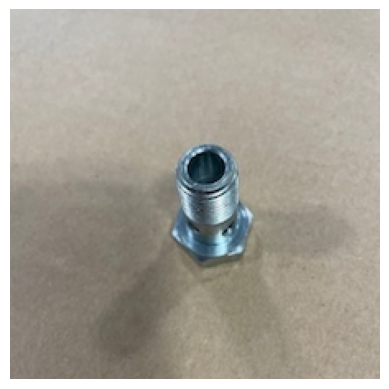

(225, 225, 3)


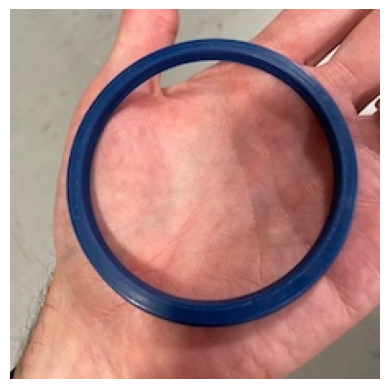

(225, 225, 3)


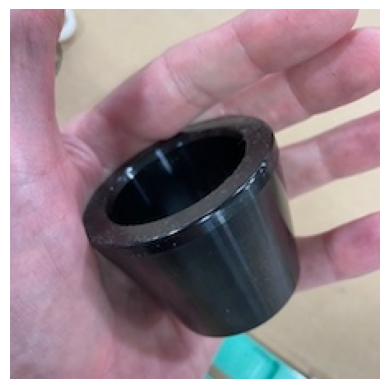

(225, 225, 3)


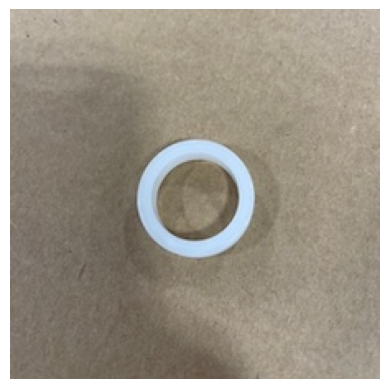

(225, 225, 3)


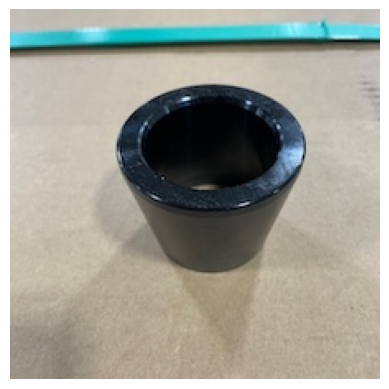

(225, 225, 3)


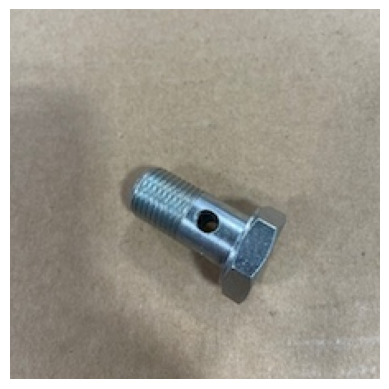

(225, 225, 3)


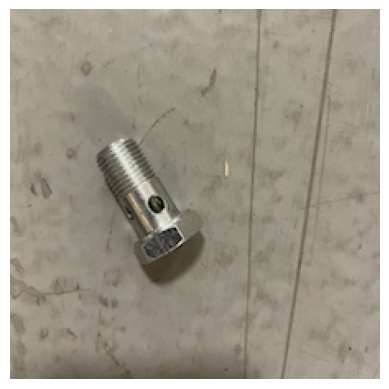

(225, 225, 3)


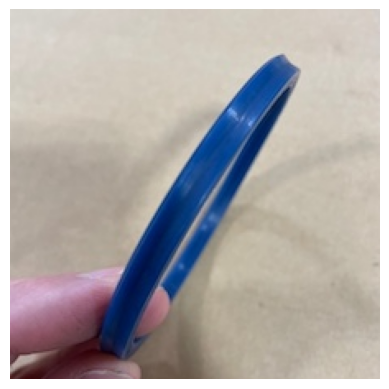

(225, 225, 3)


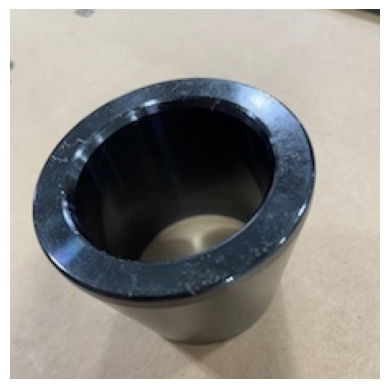

(225, 225, 3)


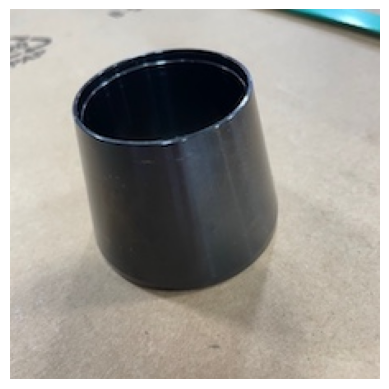

(225, 225, 3)


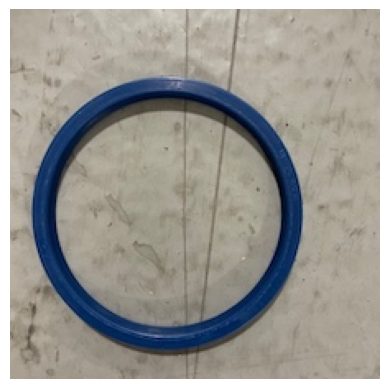

(225, 225, 3)


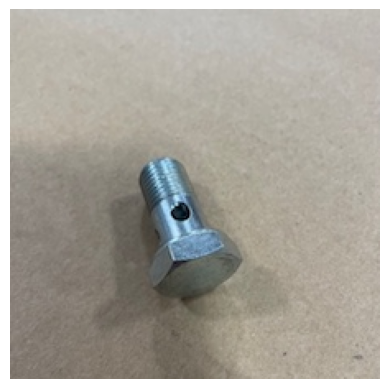

(225, 225, 3)


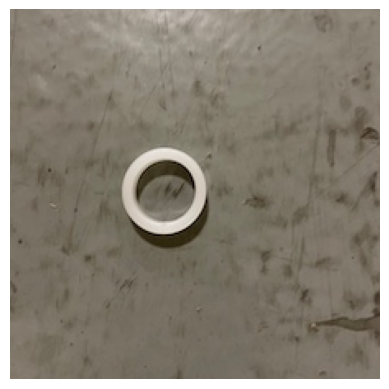

(225, 225, 3)


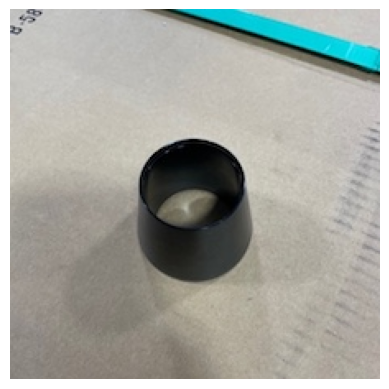

(225, 225, 3)


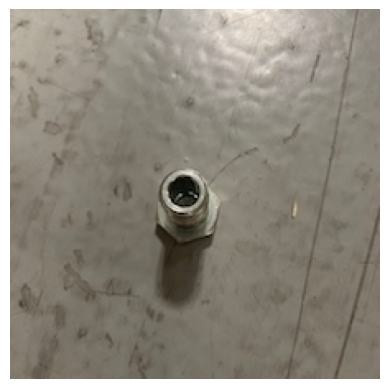

(225, 225, 3)


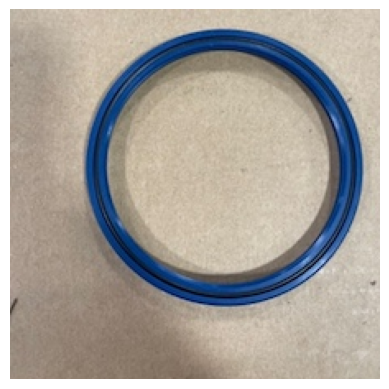

(225, 225, 3)


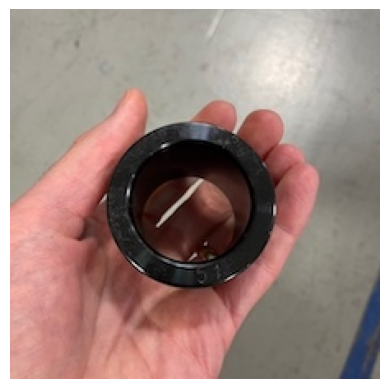

(225, 225, 3)


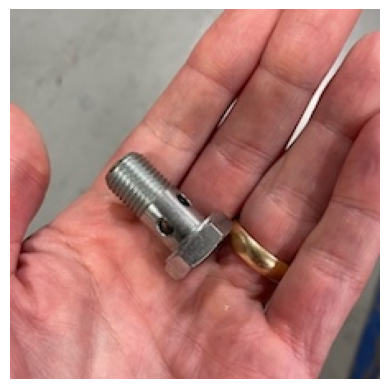

(225, 225, 3)


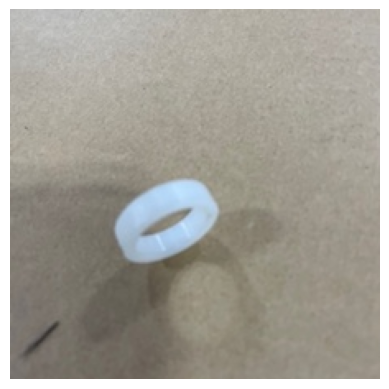

(225, 225, 3)


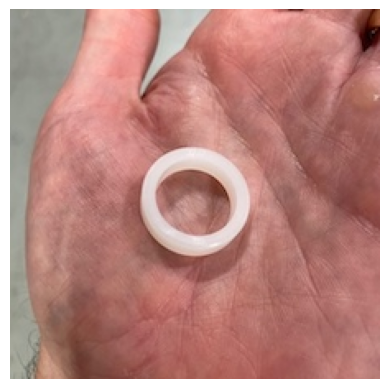

(225, 225, 3)


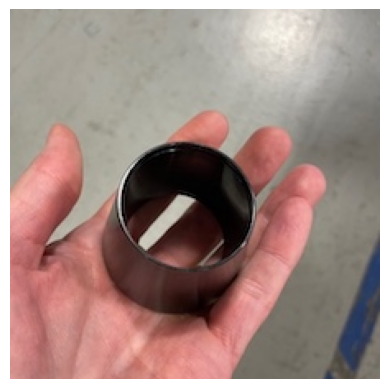

In [38]:
for file in filenames:
    img = Image.open(f"HSC_Photos/{file}")
    numpy_array = np.asarray(img)
    print(numpy_array.shape)
    plt.axis("off")
    plt.imshow(numpy_array)
    plt.show()

In [4]:
NUM_CLASSES = 4

preproc = v2.Compose([
    v2.PILToTensor(),
    v2.RandomResizedCrop(size=(224, 224), antialias=True),
    v2.RandomHorizontalFlip(p=0.5),
    v2.ToDtype(torch.float32, scale=True),  # to float32 in [0, 1]
    #v2.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),  # typically from ImageNet
])

dataloader = DataLoader(dataset, batch_size=4, shuffle=True)

cutmix = v2.CutMix(num_classes=NUM_CLASSES)
mixup = v2.MixUp(num_classes=NUM_CLASSES)
cutmix_or_mixup = v2.RandomChoice([cutmix, mixup])

for images, labels in dataloader:
    print(f"Before CutMix/MixUp: {images.shape = }, {labels.shape = }")
    images, labels = cutmix_or_mixup(images, labels)
    print(f"After CutMix/MixUp: {images.shape = }, {labels.shape = }")

    # <rest of the training loop here>
    break

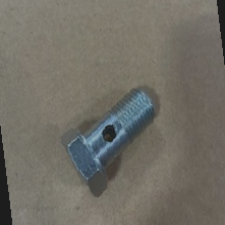

In [70]:
from torchvision import transforms

transform = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(30),
    transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3),
    transforms.RandomResizedCrop(225, scale=(0.8, 1.0)),
])

img = Image.open("HSC_Photos/B2.jpeg")
augmented_img = transform(img)
augmented_img

## Augmentation: 

This loop includes every photo augmented randomly 4 times.

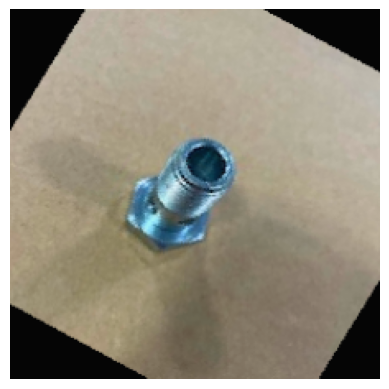

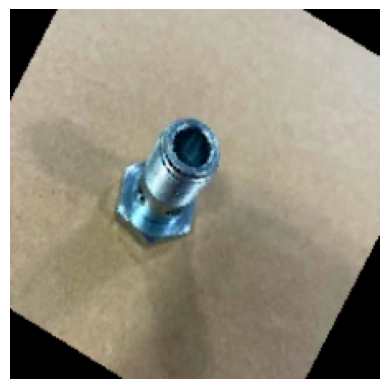

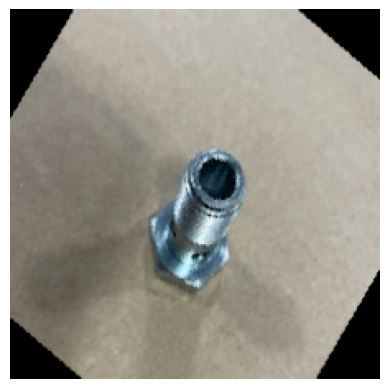

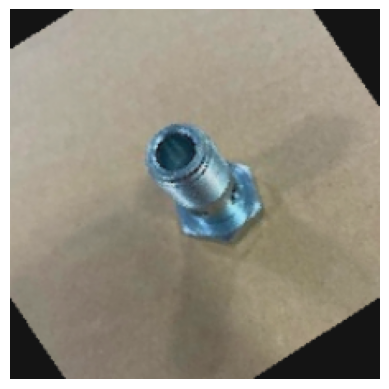

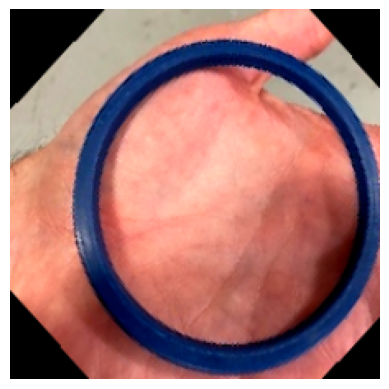

...

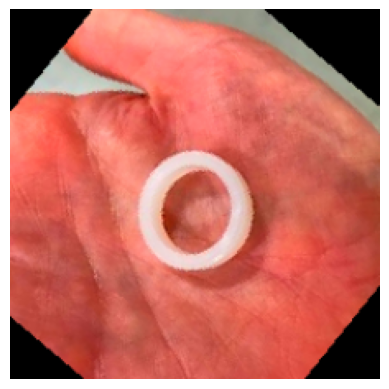

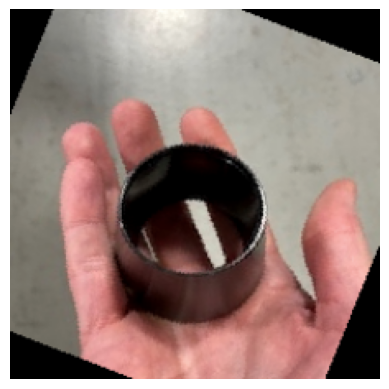

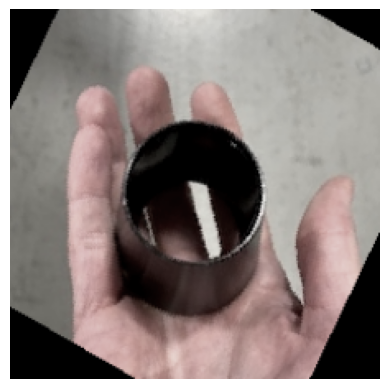

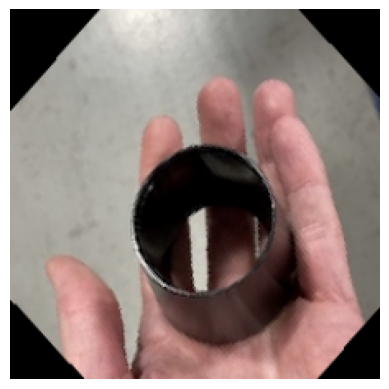

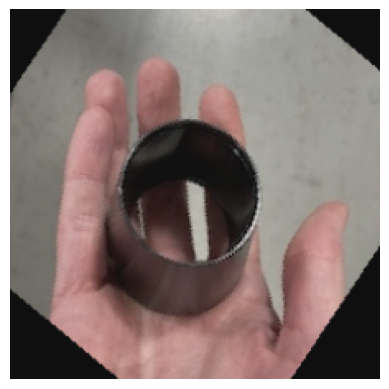

In [79]:
for file in filenames:
    img = Image.open(f"HSC_Photos/{file}")
    for i in range(4):
        augmented_img = transform2(img)
        numpy_array = np.asarray(augmented_img)
        # This line will save the photos in your current directory
        #plt.savefig(f'{file[:2]}_aug{i}.jpg', format='jpg', dpi=300, bbox_inches="tight", pad_inches=0)
        plt.axis("off")
        plt.imshow(numpy_array)
        plt.show()